## Analysis for glutamate imaging

In [1]:
import matplotlib
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from utils import *
from scipy.signal import medfilt
from scipy.stats import sem, ranksums, spearmanr, f_oneway, kruskal
%matplotlib inline
%load_ext autoreload
%autoreload 2
sns.set(font_scale=2, style='ticks')

In [2]:
vol_file = '../SnFR_data/SnFR_Log_DRN_Exp.csv'
dat_xls_file = pd.read_csv(vol_file)
dat_xls_file['folder'] = dat_xls_file['folder'].apply(lambda x: f'{x:0>8}')
dat_folder = '/nrs/ahrens/Ziqiang/Takashi_DRN_project/SnFRData/'
dff_dat_folder = '../Analysis/snfr_dff/'

In [3]:
frame_rate = 30
t_pre = 20
t_post = 30 # 1 sec according to frame-rate
t_flat = 15
t_valid = 16
color_list = ['k', 'r', 'b']

In [4]:
k_sub = gaussKernel(sigma=3)

## Random Gain

In [7]:
row = dat_xls_file.iloc[20]

In [8]:
row

Unnamed: 0                                         20
folder                                       04172019
fish                                   Fish2-2-random
task                                      Random Gain
area                                              Glu
rootDir         /mnt/Dali/Takashi/Cezanne/SPIM_newPC/
pixeldenoise                                     True
registration                                     True
detrend                                          True
demix                                            True
denoise                                          True
Name: 20, dtype: object

In [10]:
folder = row['folder']
fish = row['fish']
rootDir = row['rootDir']
swm_dir = dat_folder+f'{folder}/{fish}/swim/'
dff_dir = dat_folder+f'{folder}/{fish}/Data/'

frame_stimParams = np.load(swm_dir+'frame_stimParams.npy', allow_pickle=True)[()];
frame_swim_tcourse = np.load(swm_dir+"frame_swim_tcourse_series.npy", allow_pickle=True)[()];
rawdata = np.load(swm_dir+"rawdata.npy", allow_pickle=True)[()]
swimdata = np.load(swm_dir+"swimdata.npy", allow_pickle=True)[()]
reclen=len(swimdata['fltCh1'])
frame_tcourse=np.zeros((reclen,))
frame=np.where(np.diff((rawdata['ch3']>3).astype('int'))==1)[0]
for t in range(len(frame)-1):
    frame_tcourse[frame[t]:frame[t+1]]=t
swim_start = frame_tcourse[np.where(swimdata['swimStartT']>0)[0]].astype('int')
swim_end = frame_tcourse[np.where(swimdata['swimEndT']>0)[0]].astype('int')
# collect trial within t-pre, and t-post valid range
swim_end   = swim_end[((swim_start>t_pre) & (swim_start<(frame_swim_tcourse.shape[1]-t_post)))]
swim_start = swim_start[((swim_start>t_pre) & (swim_start<(frame_swim_tcourse.shape[1]-t_post)))]
valid = np.diff(swim_start) > t_post
swim_end = swim_end[:-1][valid]
swim_start = swim_start[:-1][valid]

swim_list = []
for ntype in range(3):
    _ = swim_start[np.where(frame_stimParams[2,swim_start+2]==ntype+1)[0]]
    valid = np.diff(_) > t_post
    if valid.sum()<10:
        continue
    swim_list.append(_[:-1][valid])

In [11]:
from skimage.io import imread

In [12]:
Y_ = imread(dff_dir+'imgDMotion.tif')

In [246]:
Y_d = imread(dff_dir+'Y_d.tif')

In [17]:
dFF = Y_d/(Y_.transpose(1,2,0)-Y_d)

In [61]:
dFF_ = dFF[valid_pix, :].mean(axis=0, keepdims=True)
dFF_ = dFF_.T

In [64]:
def baseline(data, window=100, percentile=15, downsample=1, axis=-1):
    """
    Get the baseline of a numpy array using a windowed percentile filter with optional downsampling
    data : Numpy array
        Data from which baseline is calculated
    window : int
        Window size for baseline estimation. If downsampling is used, window shrinks proportionally
    percentile : int
        Percentile of data used as baseline
    downsample : int
        Rate of downsampling used before estimating baseline. Defaults to 1 (no downsampling).
    axis : int
        For ndarrays, this specifies the axis to estimate baseline along. Default is -1.
    """
    from scipy.ndimage.filters import percentile_filter
    from scipy.interpolate import interp1d
    from numpy import ones

    size = ones(data.ndim, dtype='int')
    size[axis] *= window//downsample

    if downsample == 1:
        bl = percentile_filter(data, percentile=percentile, size=size)
    else:
        slices = [slice(None)] * data.ndim
        slices[axis] = slice(0, None, downsample)
        data_ds = data[slices]
        baseline_ds = percentile_filter(data_ds, percentile=percentile, size=size)
        interper = interp1d(range(0, data.shape[axis], downsample), baseline_ds, axis=axis, fill_value='extrapolate')
        bl = interper(range(data.shape[axis]))
    return bl

In [81]:
ave_img = Y_.mean(axis=0)

In [82]:
valid_pix = ave_img>20

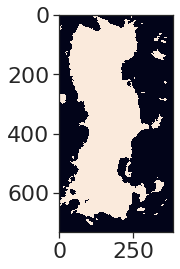

In [83]:
plt.imshow(valid_pix)

In [98]:
from skimage.exposure import equalize_adapthist as clahe
from skimage.morphology import square, dilation
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries
from skimage.morphology import dilation
block_img = ave_img.copy()
block_img[ave_img<20]=0
img_adapteq = clahe(block_img/block_img.max(), clip_limit=0.03)
segments_fz = felzenszwalb(img_adapteq, scale=100, sigma=0.5, min_size=100)

/groups/ahrens/home/weiz/miniconda3/envs/myenv/lib/python3.7/site-packages/skimage/util/dtype.py:135: UserWarning: Possible precision loss when converting from float32 to uint16
  .format(dtypeobj_in, dtypeobj_out))


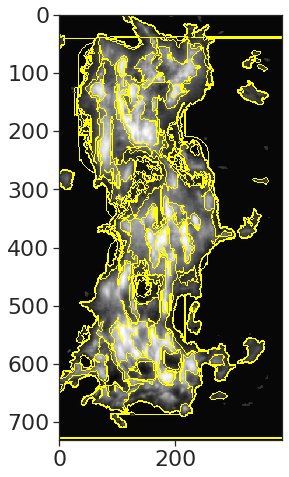

In [102]:
plt.figure(figsize=(4, 8))
plt.imshow(mark_boundaries(img_adapteq, segments_fz))

In [130]:
F = Y_[:, valid_pix].mean(axis=-1)
F_b = baseline(F, window=1000, percentile=20)
dFF_ave = F/F_b-1

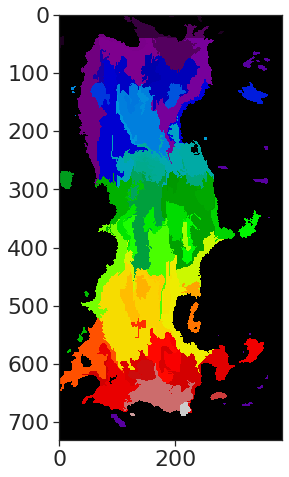

In [258]:
# for n in range(segments_fz.max()+1):
#     mask = (segments_fz==n)
#     if block_img[mask].mean()>5:
#         plt.imshow(mask)
#         plt.show()
segments_fz = felzenszwalb(img_adapteq, scale=100, sigma=0.1, min_size=300)
seg = segments_fz.copy()+1
seg[~valid_pix]=0
plt.figure(figsize=(4, 8))
plt.imshow(seg, cmap=plt.cm.nipy_spectral)

In [259]:
dFF_ = dFF_ave[:, np.newaxis]

In [260]:
t, x, y = Y_.shape

In [261]:
# from sklearn.decomposition import PCA
# pModel = PCA(n_components=10)
# dFF_ = np.zeros((t, seg.max()))
# for n in range(seg.max()):
#     seg_pix = seg==(n+1)
#     if seg_pix.sum()<50:
#         continue
#     Y_d = Y_[:, seg_pix]
#     pModel.fit(Y_d) 
#     Y_d = pModel.inverse_transform(pModel.transform(Y_d))
#     F = Y_d.mean(axis=-1)
#     F_b = baseline(F, window=1000, percentile=20)
#     dFF_[:, n] = F/F_b-1
#     dFF_[:100, n] = 0

In [247]:
dFF = Y_d/(Y_.transpose(1,2,0)-Y_d)

In [262]:
k_sub = gaussKernel(sigma=1)
dFF_ = np.zeros((t, seg.max()))
seg_list=[]
for n in range(seg.max()):
    seg_pix = seg==(n+1)
    if seg_pix.sum()<300:
        continue
    F = Y_[:, seg_pix].mean(axis=-1)
    F_b = baseline(F, window=1000, percentile=20)
    # F = smooth(F, k_sub)
    _ = F/F_b-1
    # _ = dFF[seg_pix, :].mean(axis=0)
    # _ = smooth(_, k_sub)
    _[:100] = 0
    dFF_[:, n] = _
    seg_list.append(seg_pix)

In [263]:
dFF_ = dFF_[:, np.abs(dFF_).sum(axis=0)>0]

['04172019', 'Fish2-2-random']
0.0


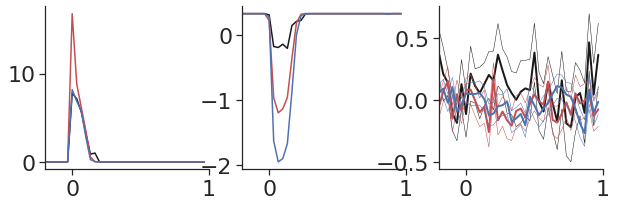

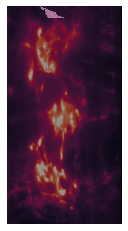

0.03333333333333333


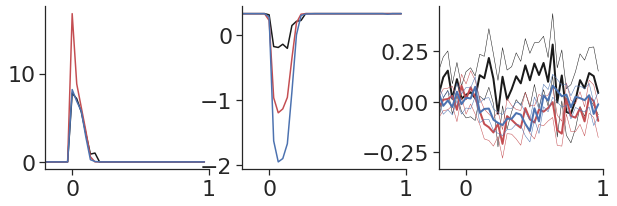

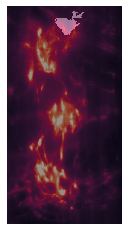

0.13333333333333333


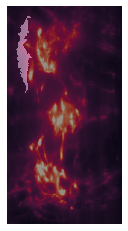

0.0


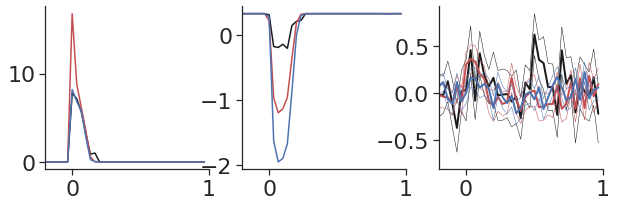

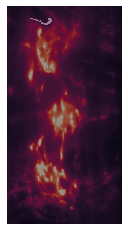

0.0


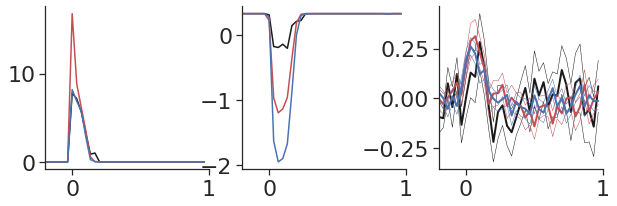

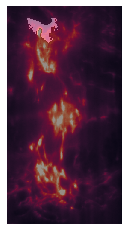

0.0


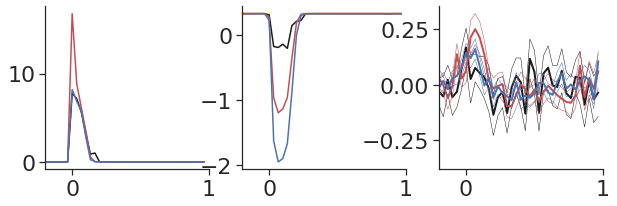

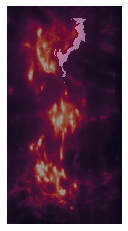

0.06666666666666667


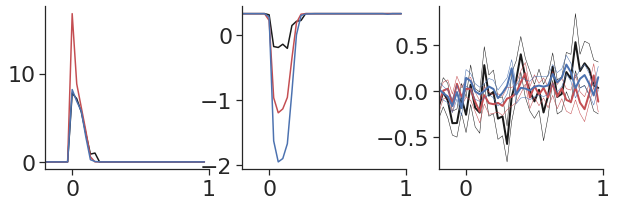

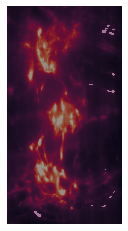

0.0


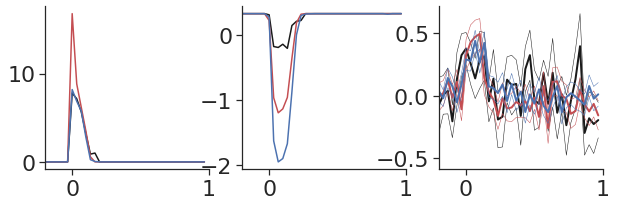

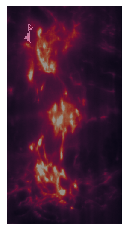

0.0


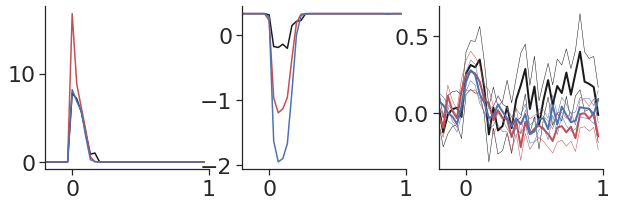

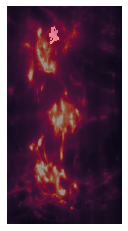

0.0


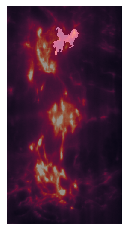

0.03333333333333333


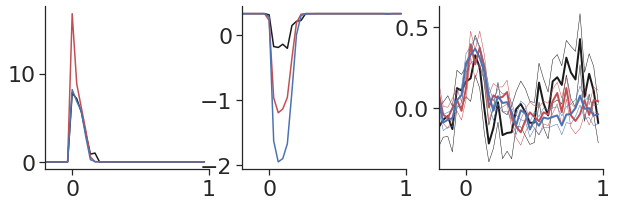

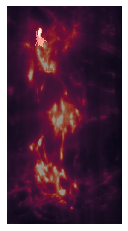

0.06666666666666667


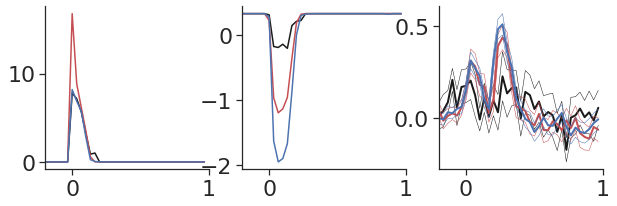

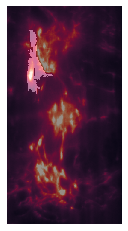

0.1


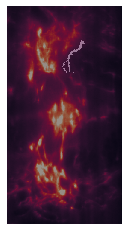

0.0


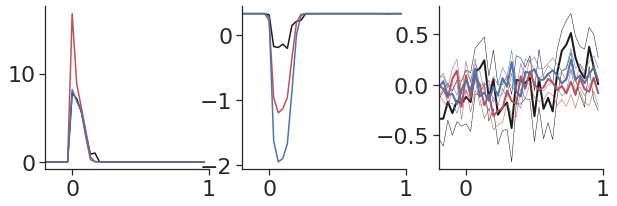

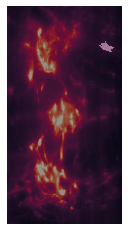

0.06666666666666667


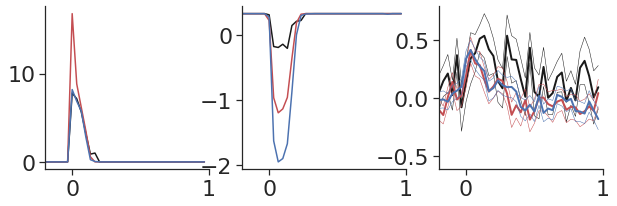

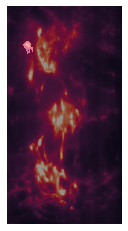

0.06666666666666667


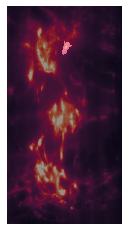

0.03333333333333333


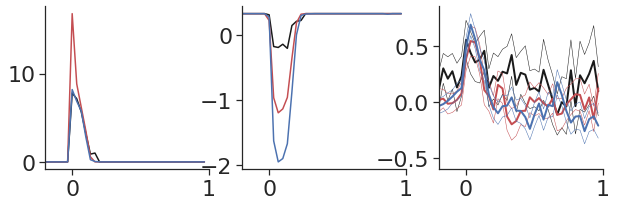

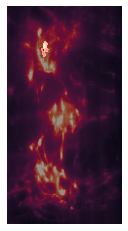

0.1


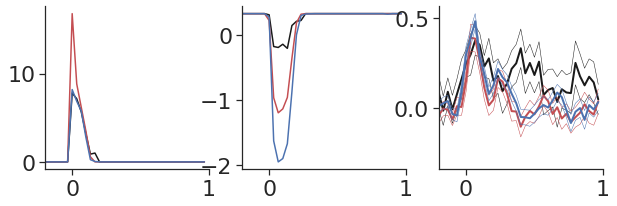

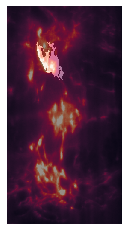

0.03333333333333333


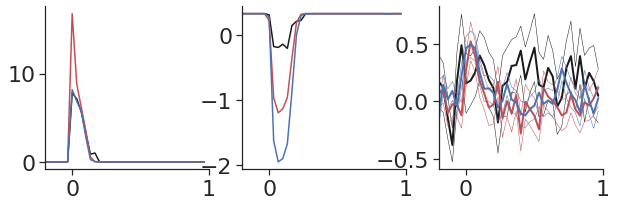

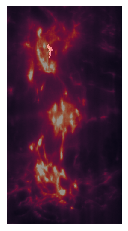

0.03333333333333333


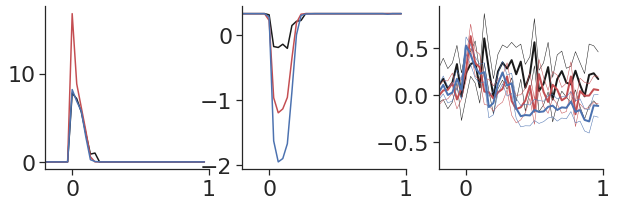

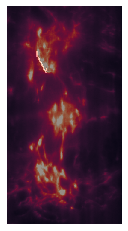

0.0


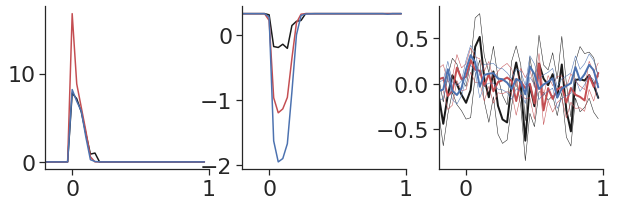

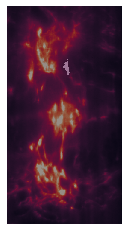

0.03333333333333333


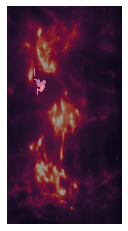

0.03333333333333333


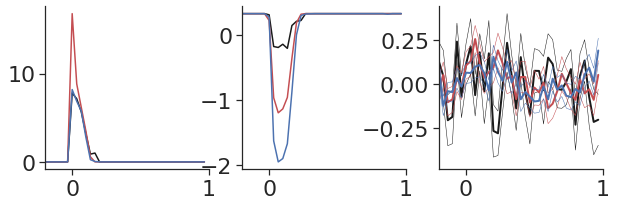

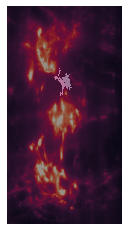

0.03333333333333333


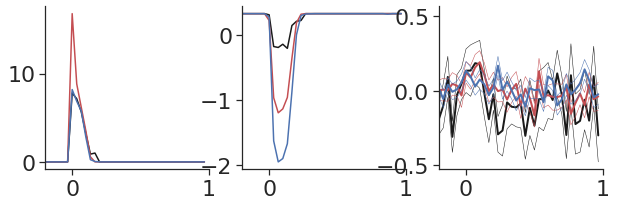

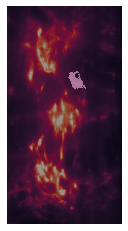

0.03333333333333333


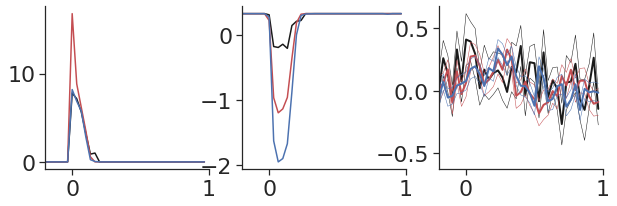

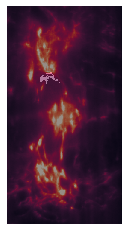

0.0


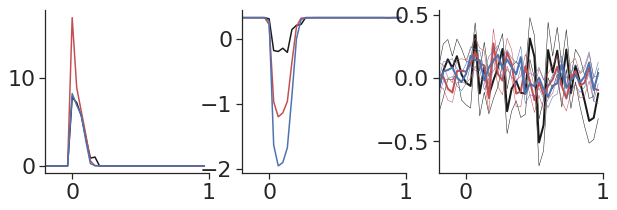

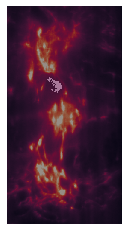

0.03333333333333333


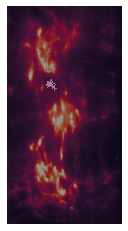

0.06666666666666667


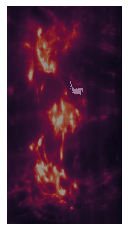

0.06666666666666667


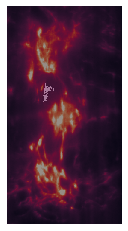

0.0


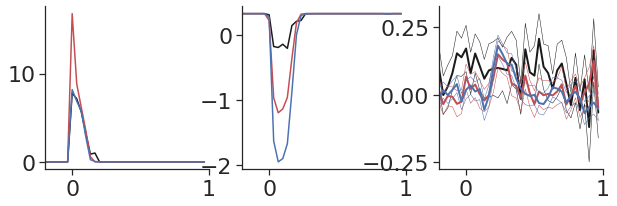

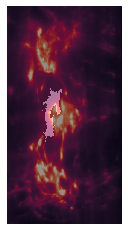

0.0


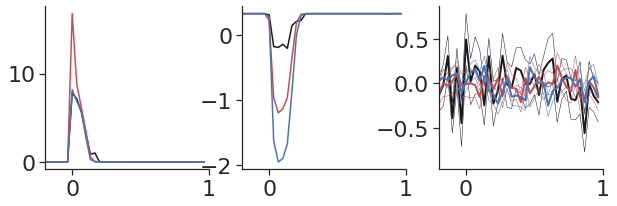

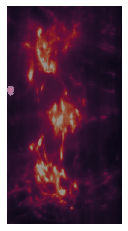

0.0


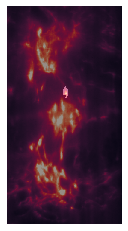

0.0


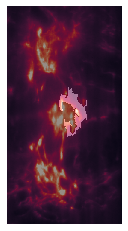

0.0


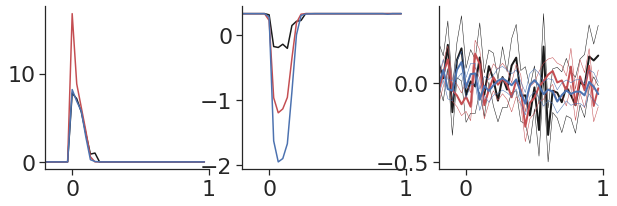

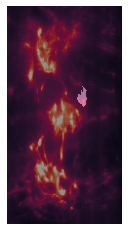

0.06666666666666667


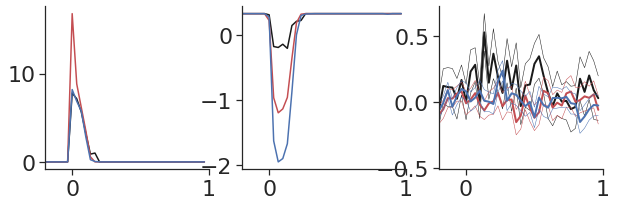

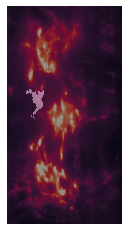

0.0


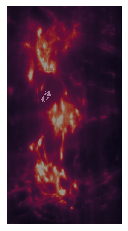

0.0


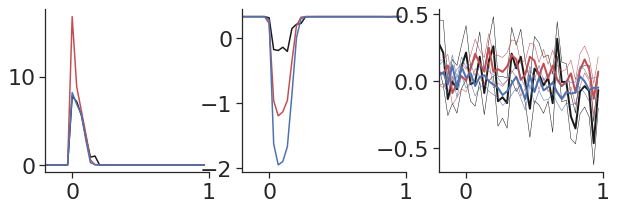

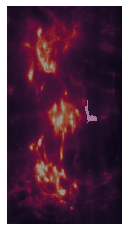

0.0


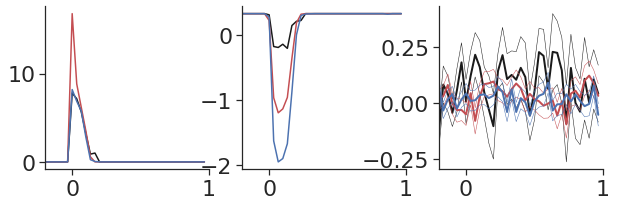

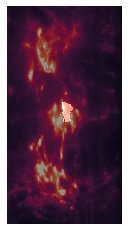

0.06666666666666667


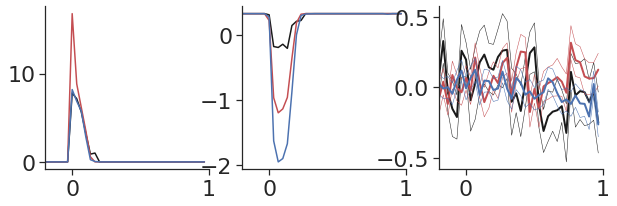

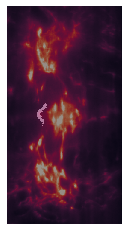

0.0


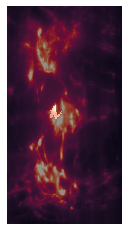

0.1


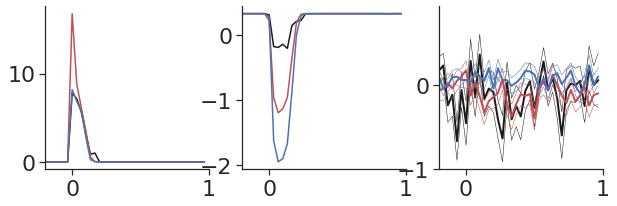

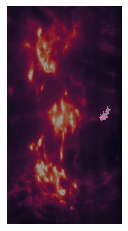

0.0


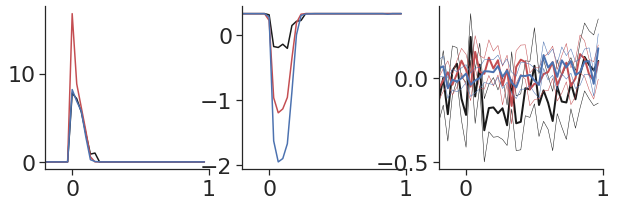

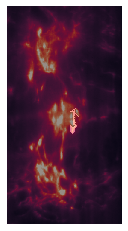

0.0


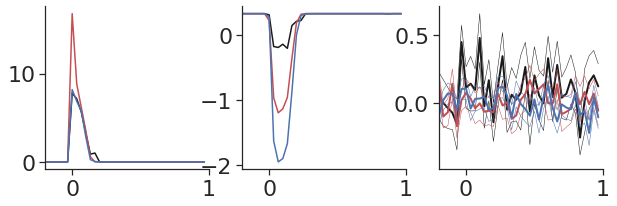

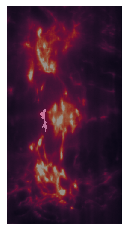

0.0


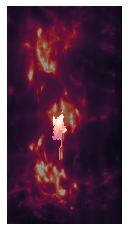

0.0


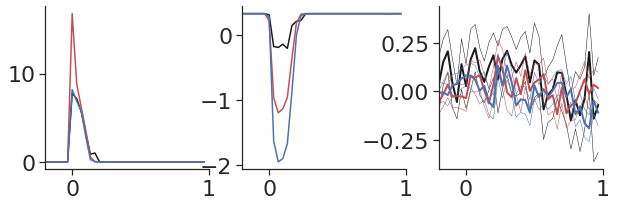

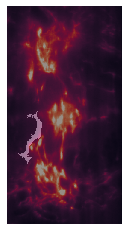

0.06666666666666667


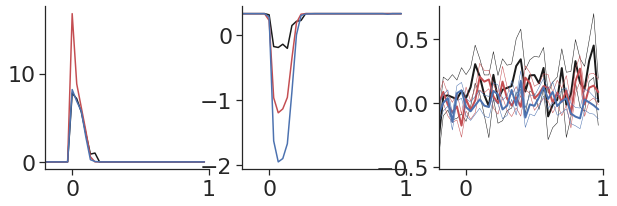

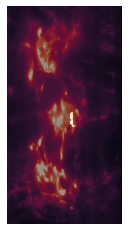

0.0


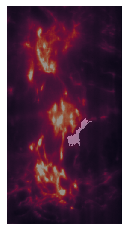

0.03333333333333333


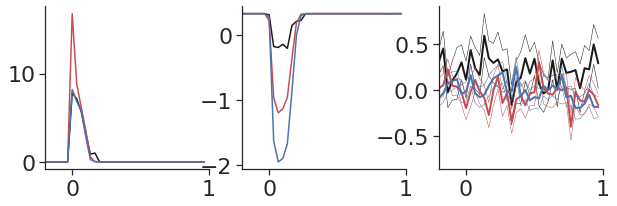

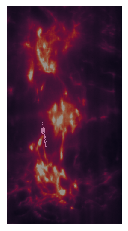

0.0


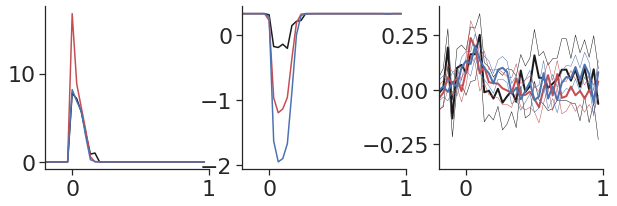

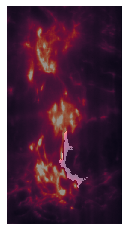

0.03333333333333333


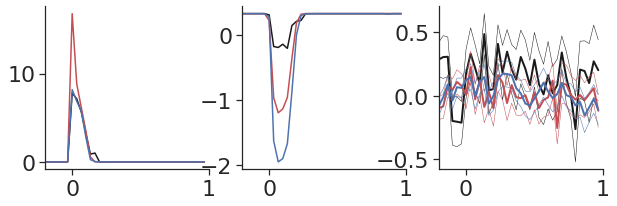

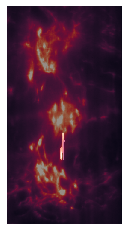

0.0


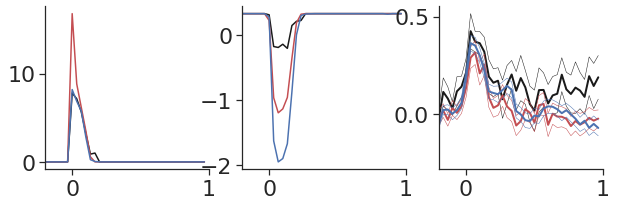

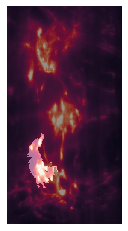

0.06666666666666667


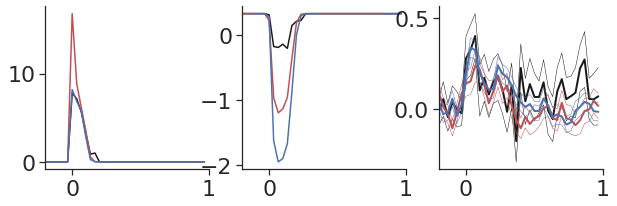

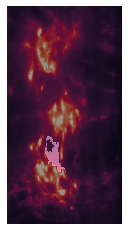

0.1


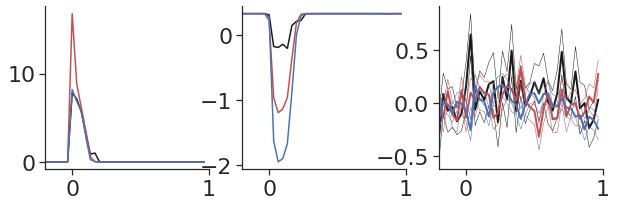

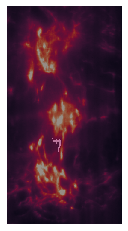

0.03333333333333333


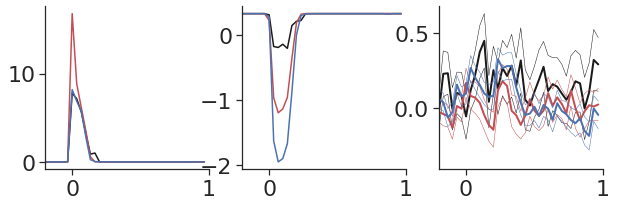

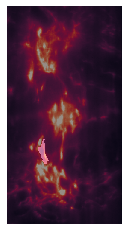

0.03333333333333333


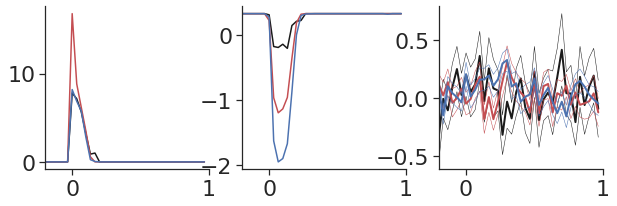

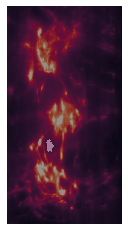

0.03333333333333333


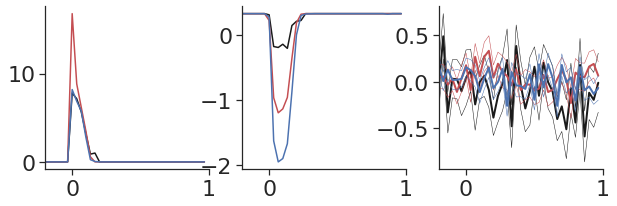

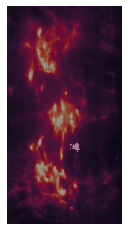

0.0


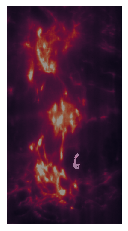

0.0


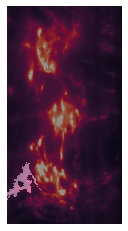

0.0


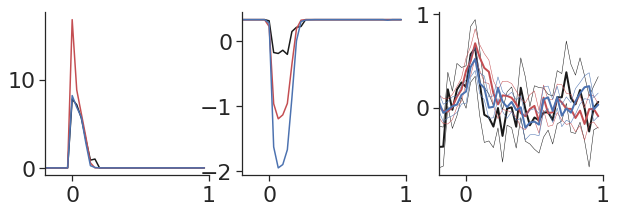

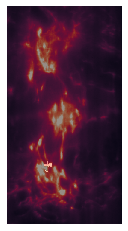

0.0


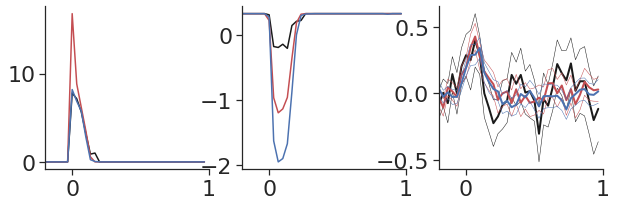

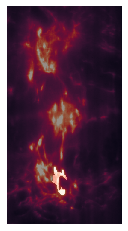

0.0


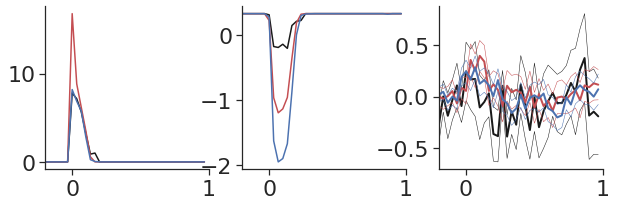

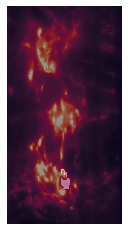

0.23333333333333334


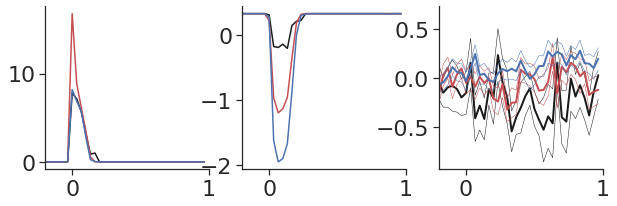

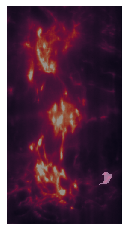

0.0


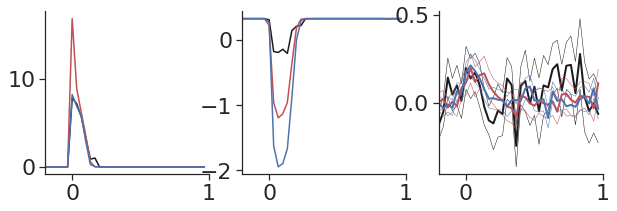

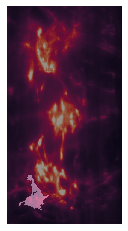

0.0


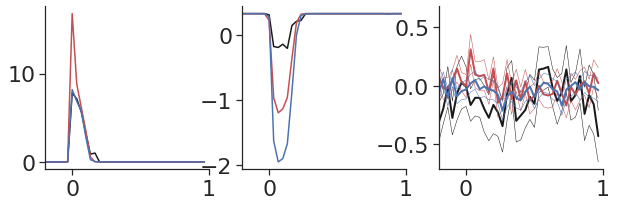

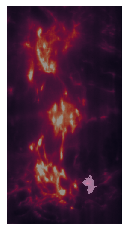

0.0


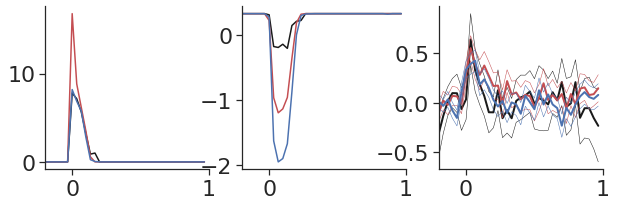

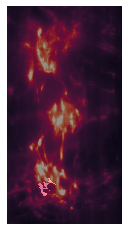

0.0


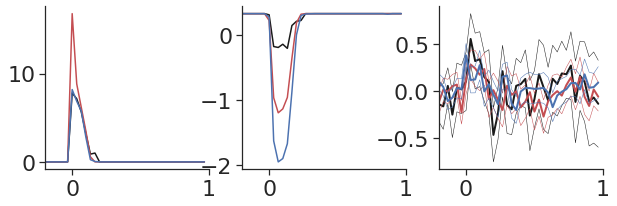

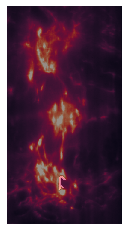

0.0


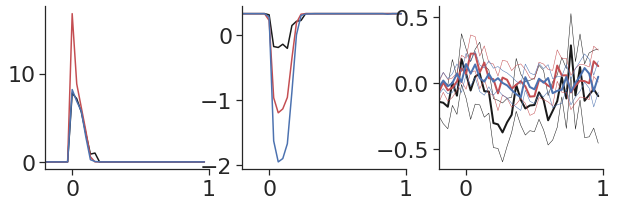

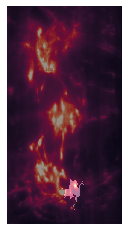

0.0


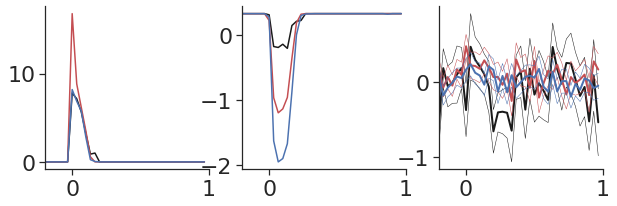

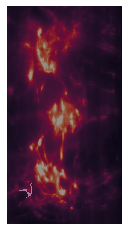

0.03333333333333333


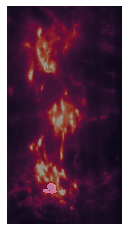

0.0


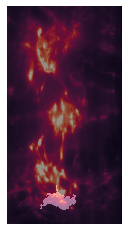

0.03333333333333333


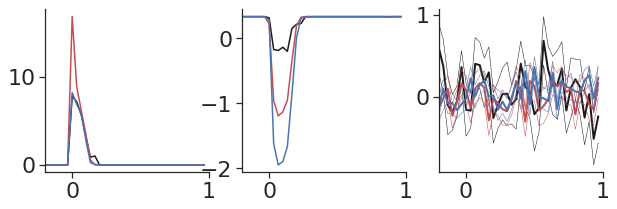

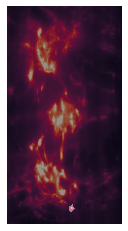

In [264]:
# _ = np.load(dff_dat_folder+f'{folder}_{fish}_snfr_dff_dat.npz', allow_pickle=True)
# # image
# ave = _['Y_mean']
# A_ = _['A']
# dFF_ = _['dFF_ave'][:, np.newaxis]
n_pix = dFF_.shape[-1]

#     for nn_ in range(n_pix):
#         dFF_[:, nn_] = smooth(dFF_[:, nn_], k_sub)

dff_list = []
pswim_list = []
vis_list = []
num_swim_list = []
t_len = int(t_pre+t_post)
for nn_, nswim in enumerate(swim_list):
    num_swim = len(nswim)
    num_swim_list.append(num_swim)
    dff_ = np.zeros((num_swim, t_len, n_pix))
    pswim_ = np.zeros((num_swim, t_len))
    vis_ = np.zeros((num_swim, t_len))
    for ns, s in enumerate(nswim):
        l_swim = frame_swim_tcourse[1,(s-t_pre):(s+t_post)]
        r_swim = frame_swim_tcourse[2,(s-t_pre):(s+t_post)]
        pswim_[ns] = (l_swim + r_swim)*100000# np.sqrt(l_swim**2 + r_swim**2)*100000 # TK: 10000
        dff_[ns] = dFF_[(s-t_pre):(s+t_post), :] - dFF_[(s-t_flat):s, :].mean(axis=0, keepdims=True)
        vis_[ns] = -frame_stimParams[0,(s-t_pre):(s+t_post)]*10000

    valid_ = pswim_[:, -t_valid:].sum(axis=-1)==0
    # valid_ = valid_ & (pswim_.max(axis=-1)<20) # results hold as it changed to 100
    valid_ = valid_ & (pswim_[:, :t_pre].sum(axis=-1)==0)
    valid_ = valid_ & ((vis_[:, :t_pre]<0).sum(axis=-1)==0)

    if valid_.sum()>10:
        dff_list.append(dff_[valid_])
        pswim_list.append(pswim_[valid_])
        vis_list.append(vis_[valid_])

# print([folder, fish])
# fig, ax = plt.subplots(1, 3, figsize=(10, 3))
# ax = ax.flatten()
# color_list = ['k', 'r', 'b']
# for n in range(3):
#     ax[0].plot(np.arange(-t_pre, t_post)/frame_rate, pswim_list[n].mean(axis=0), color_list[n])
#     ax[1].plot(np.arange(-t_pre, t_post)/frame_rate, vis_list[n].mean(axis=0), color_list[n])
#     ax[2].plot(np.arange(-t_pre, t_post)/frame_rate, dff_list[n].mean(axis=0).mean(axis=-1)*100, color_list[n])
# #     ax[2].plot(np.arange(-t_pre, t_post)/frame_rate, dff_list[n][:,:,10].mean(axis=0)*100, color_list[n])
# sns.despine()
# ax[0].set_xlim([-0.2, 1.0])
# ax[1].set_xlim([-0.2, 1.0])
# ax[2].set_xlim([-0.2, 1.0])
# # plt.savefig('../Plots/glu/example_fish_random_delay.svg')
# plt.show()

print([folder, fish])
n_c = dFF_.shape[-1]
valid_c = np.zeros(n_c).astype('bool')
# x, y = ave.shape
for m in range(n_c):
    p_vec = np.ones(t_pre+t_post)
    for n_t in range(t_pre+t_post):
        _, p = kruskal(*[list(dff_list[i][:, n_t, m]) for i in range(3)])
        p_vec[n_t] = p
    print((p_vec[t_pre:]<0.05).mean())

    if ((p_vec[:t_pre]>0.05).mean()>0.9) and ((p_vec[t_pre:]<0.05).mean()>=0):
        valid_c[m] = True
        fig, ax = plt.subplots(1, 3, figsize=(10, 3))
        ax = ax.flatten()
        color_list = ['k', 'r', 'b']
        for n in range(3):
            mean_ = np.mean(dff_list[n][:,:,m], axis=0)*100
            sem_ = sem(dff_list[n][:,:,m], axis=0)*100
            ax[0].plot(np.arange(-t_pre, t_post)/frame_rate, pswim_list[n].mean(axis=0), color_list[n])
            ax[1].plot(np.arange(-t_pre, t_post)/frame_rate, vis_list[n].mean(axis=0), color_list[n])
            ax[2].plot(np.arange(-t_pre, t_post)/frame_rate, mean_, color_list[n], lw=2)
            ax[2].plot(np.arange(-t_pre, t_post)/frame_rate, mean_+sem_, color_list[n], lw=0.5)
            ax[2].plot(np.arange(-t_pre, t_post)/frame_rate, mean_-sem_, color_list[n], lw=0.5)
        sns.despine()
        ax[0].set_xlim([-0.2, 1.0])
        ax[1].set_xlim([-0.2, 1.0])
        ax[2].set_xlim([-0.2, 1.0])
        # plt.savefig('../Plots/glu/example_fish_random_delay.svg')
        plt.show()

    plt.imshow(ave_img, vmax=np.percentile(ave_img, 99))
    plt.imshow(seg_list[m], cmap=plt.cm.gray, alpha=0.4)
    plt.axis('off')
    plt.show()

## Random Delay

['04182019', 'Fish1-3-delay']


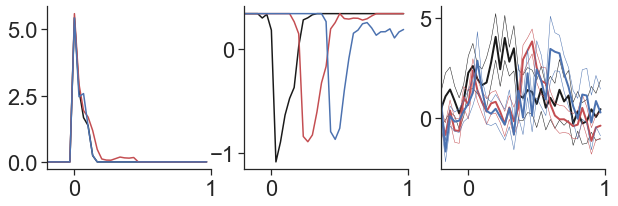

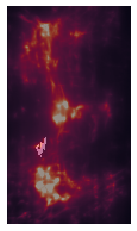

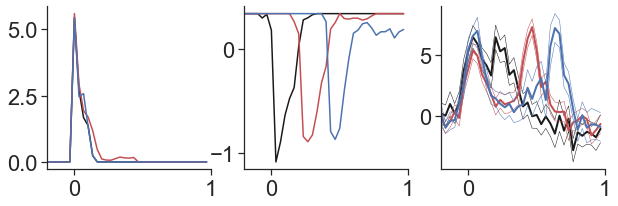

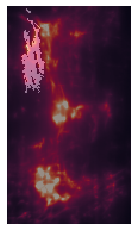

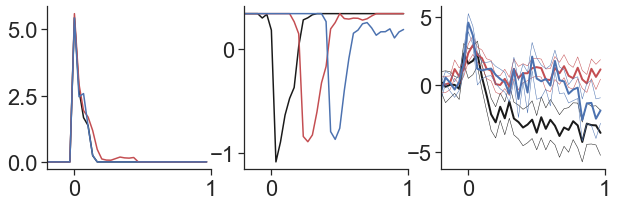

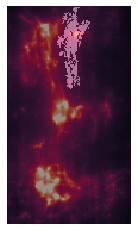

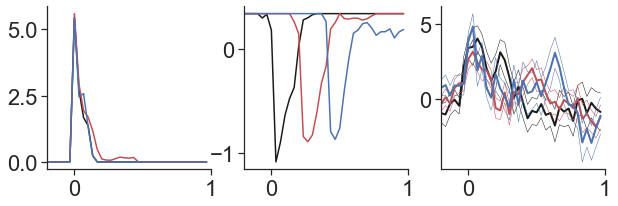

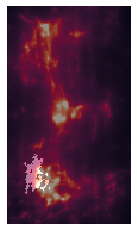

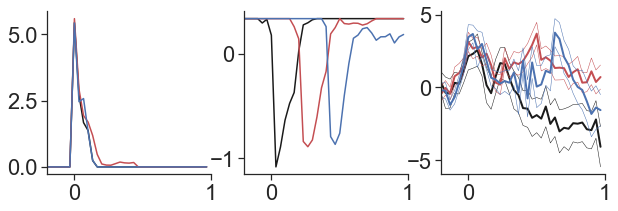

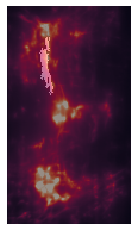

['04182019', 'Fish1-5-delay']


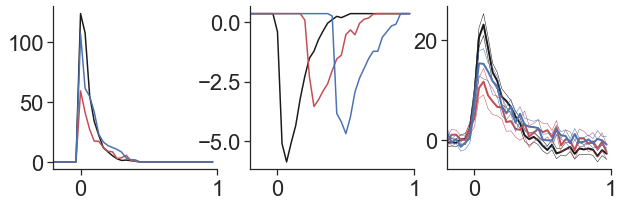

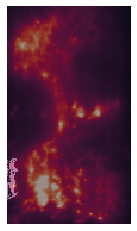

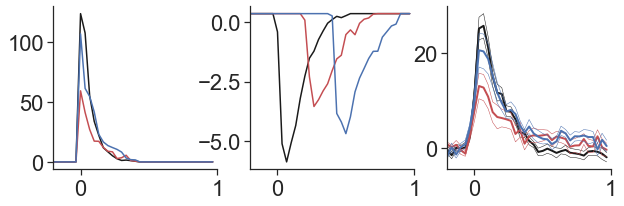

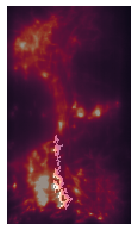

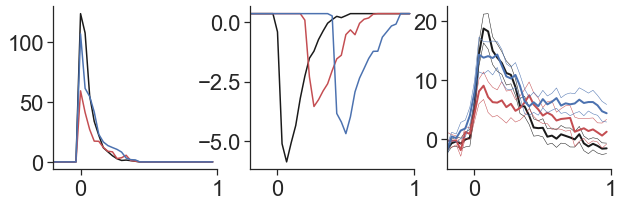

...

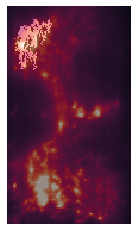

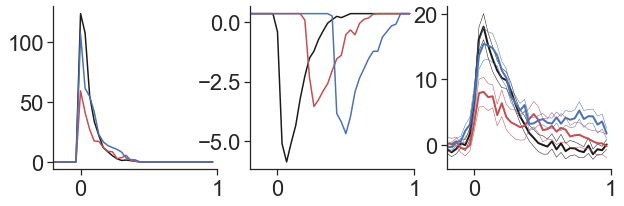

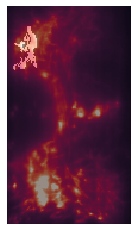

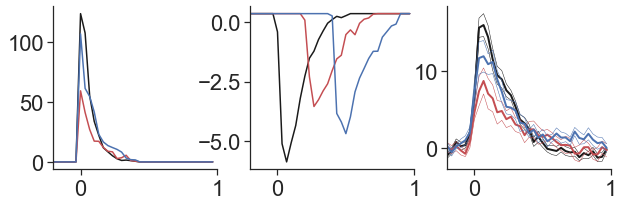

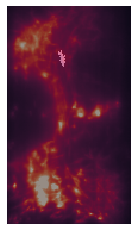

['05012019', 'Fish2-2-RandomDelay']
['05012019', 'Fish2-4-RandomDelay']
['05012019', 'Fish3-2-RandomDelay']
['05012019', 'Fish3-4-RandomDelay']


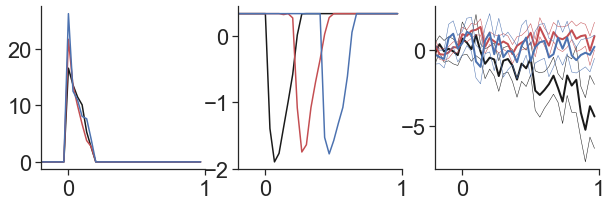

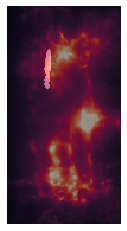

In [11]:
vel_list = []
power_list = []
power_con_list = []
fish_list = []

for index, row in dat_xls_file.iterrows():
    if row['type'] != 'tph2':
        continue
    if row['task'] != 'Delayed feedback':
        continue
    if row['area'] != 'Glu':
        continue
    folder = row['folder']
    fish = row['fish']
    rootDir = row['rootDir']
    swm_dir = dat_folder+f'{folder}/{fish}/swim/'
    img_dir = rootDir+f'{folder}/{fish}/Registered'
    dff_dir = dat_folder+f'{folder}/{fish}/Data/'
    
    frame_stimParams = np.load(swm_dir+'frame_stimParams.npy', allow_pickle=True)[()];
    frame_swim_tcourse = np.load(swm_dir+"frame_swim_tcourse_series.npy", allow_pickle=True)[()];
    rawdata = np.load(swm_dir+"rawdata.npy", allow_pickle=True)[()]
    swimdata = np.load(swm_dir+"swimdata.npy", allow_pickle=True)[()]
    reclen=len(swimdata['fltCh1'])
    frame_tcourse=np.zeros((reclen,))
    frame=np.where(np.diff((rawdata['ch3']>3).astype('int'))==1)[0]
    for t in range(len(frame)-1):
        frame_tcourse[frame[t]:frame[t+1]]=t
    swim_start = frame_tcourse[np.where(swimdata['swimStartT']>0)[0]].astype('int')
    swim_end = frame_tcourse[np.where(swimdata['swimEndT']>0)[0]].astype('int')
    # collect trial within t-pre, and t-post valid range
    swim_end   = swim_end[((swim_start>t_pre) & (swim_start<(frame_swim_tcourse.shape[1]-t_post)))]
    swim_start = swim_start[((swim_start>t_pre) & (swim_start<(frame_swim_tcourse.shape[1]-t_post)))]
    valid = np.diff(swim_start) > t_post
    swim_end = swim_end[:-1][valid]
    swim_start = swim_start[:-1][valid]
    
    swim_list = []
    for ntype in range(3):
        _ = swim_start[np.where(frame_stimParams[2,swim_start+2]==ntype+1)[0]]
        valid = np.diff(_) > t_post
        if valid.sum()<10:
            continue
        swim_list.append(_[:-1][valid])
    
    if len(swim_list)<3:
        continue
    if np.concatenate(swim_list).shape[0]<30:
        continue

    # image
    ave = np.load(dff_dir+'ave_img.npy')
    # get dff data
    _ = np.load(dff_dir+'components.npz');
    A_ = _['A_']
    C_ = _['C_']
    dFF_ = C_.T
    n_pix = dFF_.shape[-1]

    dff_list = []
    pswim_list = []
    vis_list = []
    num_swim_list = []
    t_len = int(t_pre+t_post)
    for nn_, nswim in enumerate(swim_list):
        num_swim = len(nswim)
        num_swim_list.append(num_swim)
        dff_ = np.zeros((num_swim, t_len, n_pix))
        pswim_ = np.zeros((num_swim, t_len))
        vis_ = np.zeros((num_swim, t_len))
        for ns, s in enumerate(nswim):
            l_swim = frame_swim_tcourse[1,(s-t_pre):(s+t_post)]
            r_swim = frame_swim_tcourse[2,(s-t_pre):(s+t_post)]
            pswim_[ns] = np.sqrt(l_swim**2 + r_swim**2)*100000 # TK: 10000
            dff_[ns] = dFF_[(s-t_pre):(s+t_post), :] - dFF_[(s-t_flat):s, :].mean(axis=0, keepdims=True)
            vis_[ns] = -frame_stimParams[0,(s-t_pre):(s+t_post)]*10000
        
        valid_ = pswim_[:, -t_valid:].sum(axis=-1)==0
        # valid_ = valid_ & (pswim_.max(axis=-1)<20) # results hold as it changed to 100
        valid_ = valid_ & (pswim_[:, :t_pre].sum(axis=-1)==0)
        valid_ = valid_ & ((vis_[:, :max(t_pre+nn_*6-2, 0)]<-0.01).sum(axis=-1)==0)
        
        if valid_.sum()>10:
            dff_list.append(dff_[valid_])
            pswim_list.append(pswim_[valid_])
            vis_list.append(vis_[valid_])
    
    if len(dff_list)<3:
        continue

#     fig, ax = plt.subplots(1, 3, figsize=(10, 3))
#     ax = ax.flatten()
#     color_list = ['k', 'r', 'b']
#     for n in range(3):
#         ax[0].plot(np.arange(-t_pre, t_post)/frame_rate, pswim_list[n].mean(axis=0), color_list[n])
#         ax[1].plot(np.arange(-t_pre, t_post)/frame_rate, vis_list[n].mean(axis=0), color_list[n])
#         ax[2].plot(np.arange(-t_pre, t_post)/frame_rate, dff_list[n].mean(axis=0).mean(axis=-1)*100, color_list[n])
#     #     ax[2].plot(np.arange(-t_pre, t_post)/frame_rate, dff_list[n][:,:,10].mean(axis=0)*100, color_list[n])
#     sns.despine()
#     ax[0].set_xlim([-0.2, 1.0])
#     ax[1].set_xlim([-0.2, 1.0])
#     ax[2].set_xlim([-0.2, 1.0])
#     # plt.savefig('../Plots/glu/example_fish_random_delay.svg')
#     plt.show()

    print([folder, fish])
    n_c = C_.shape[0]
    valid_c = np.zeros(n_c).astype('bool')
    x, y = ave.shape
    for m in range(n_c):
        p_vec = np.ones(t_pre+t_post)
        for n_t in range(t_pre+t_post):
            _, p = kruskal(*[list(dff_list[i][:, n_t, m]) for i in range(3)])
            p_vec[n_t] = p
#         print((p_vec[t_pre:]<0.05).mean())

        if ((p_vec[:t_pre]>0.05).mean()>0.9) and ((p_vec[t_pre:]<0.05).mean()>=0.2):
            valid_c[m] = True
            fig, ax = plt.subplots(1, 3, figsize=(10, 3))
            ax = ax.flatten()
            color_list = ['k', 'r', 'b']
            for n in range(3):
                mean_ = np.mean(dff_list[n][:,:,m], axis=0)*100
                sem_ = sem(dff_list[n][:,:,m], axis=0)*100
                ax[0].plot(np.arange(-t_pre, t_post)/frame_rate, pswim_list[n].mean(axis=0), color_list[n])
                ax[1].plot(np.arange(-t_pre, t_post)/frame_rate, vis_list[n].mean(axis=0), color_list[n])
                ax[2].plot(np.arange(-t_pre, t_post)/frame_rate, mean_, color_list[n], lw=2)
                ax[2].plot(np.arange(-t_pre, t_post)/frame_rate, mean_+sem_, color_list[n], lw=0.5)
                ax[2].plot(np.arange(-t_pre, t_post)/frame_rate, mean_-sem_, color_list[n], lw=0.5)
            sns.despine()
            ax[0].set_xlim([-0.2, 1.0])
            ax[1].set_xlim([-0.2, 1.0])
            ax[2].set_xlim([-0.2, 1.0])
            # plt.savefig('../Plots/glu/example_fish_random_delay.svg')
            plt.show()
            
            plt.imshow(ave, vmax=np.percentile(ave, 99))
            plt.imshow(A_[:, m].reshape(y, x).T>0, cmap=plt.cm.gray, alpha=0.4)
            plt.axis('off')
            plt.show()

## Gain Adapation

['04102019', 'Fish2-1']


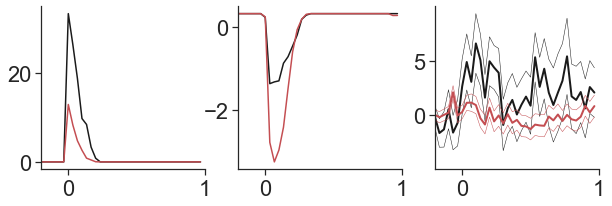

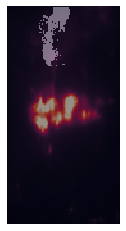

['04102019', 'Fish2-2']


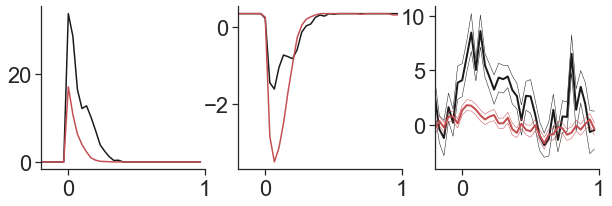

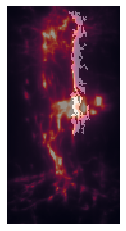

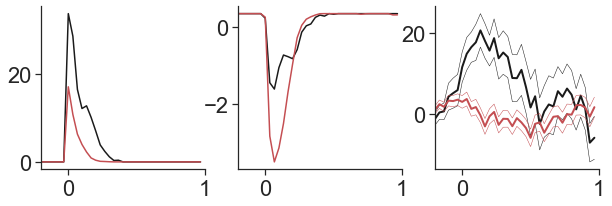

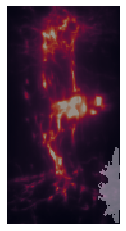

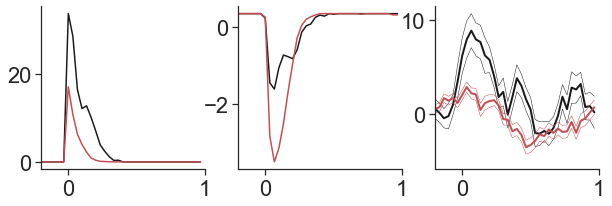

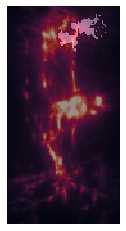

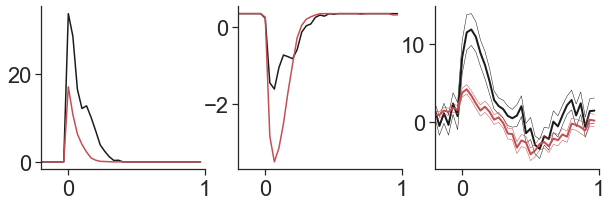

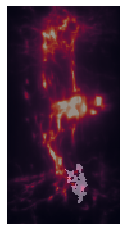

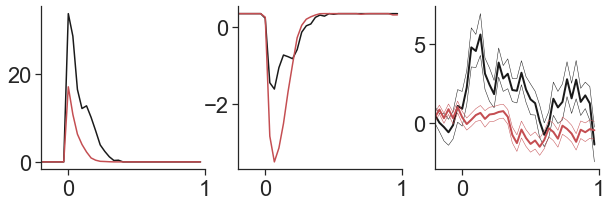

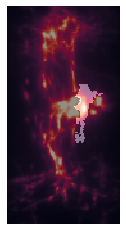

['04102019', 'Fish2-3']


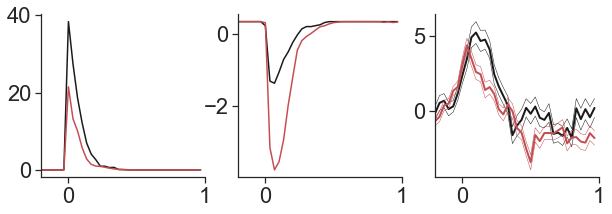

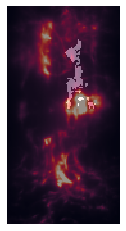

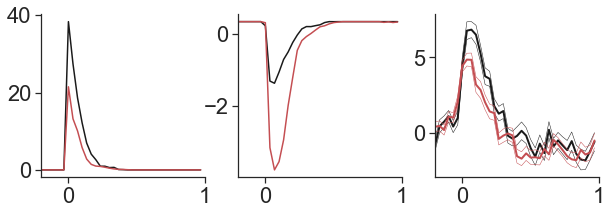

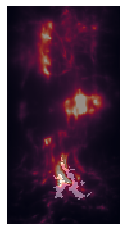

['04102019', 'Fish3-2']


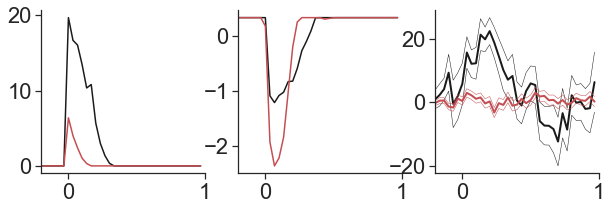

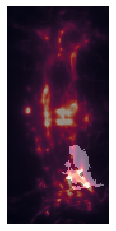

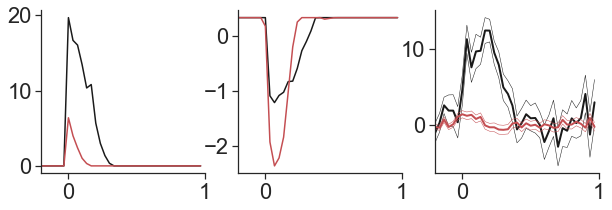

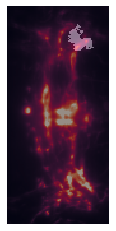

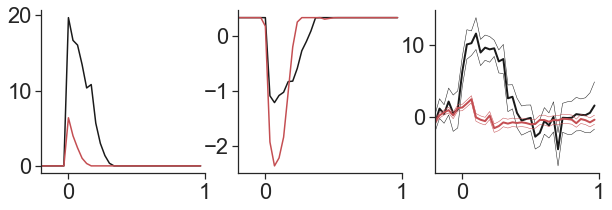

...

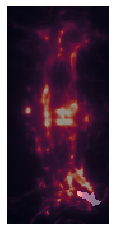

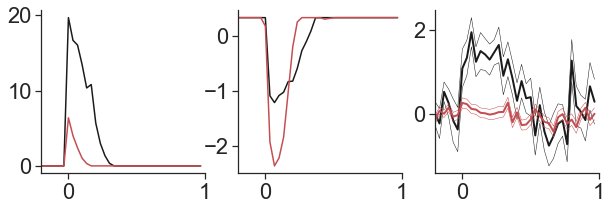

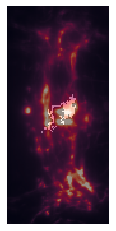

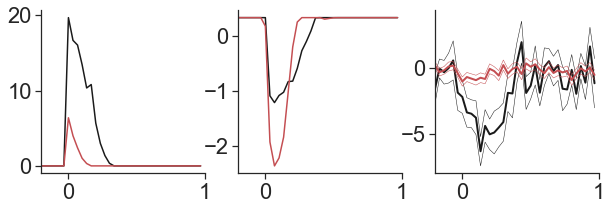

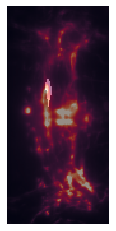

['04102019', 'Fish3-3']


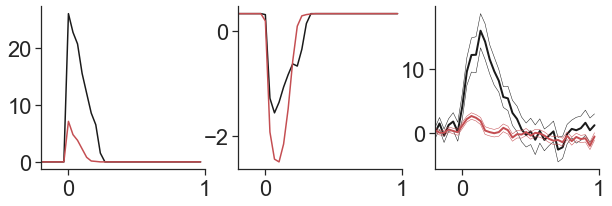

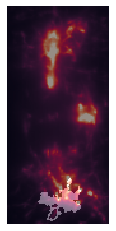

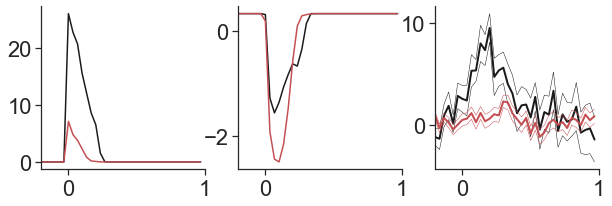

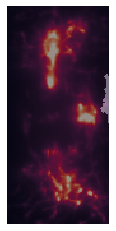

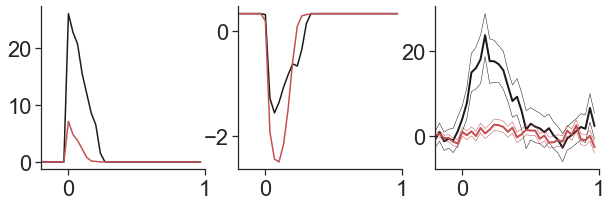

...

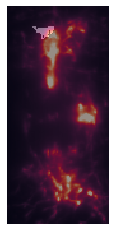

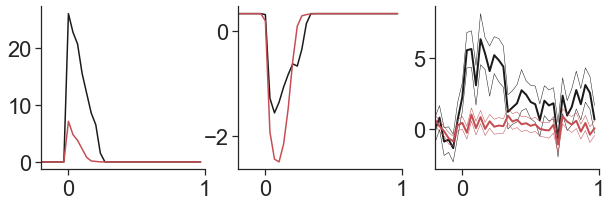

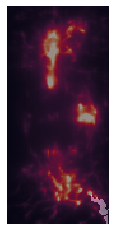

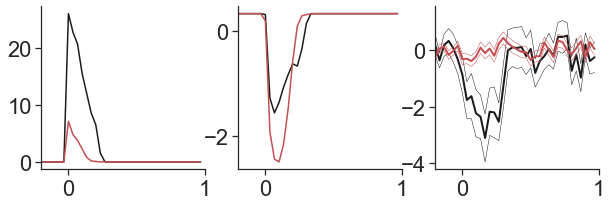

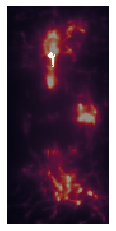

['04102019', 'Fish3-4']


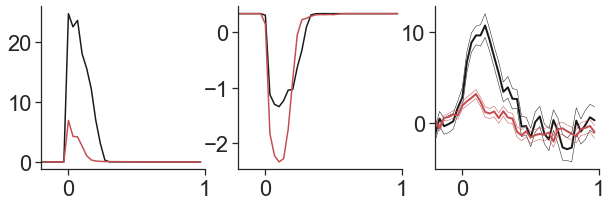

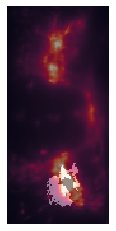

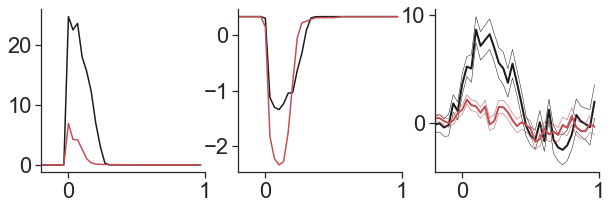

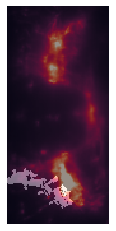

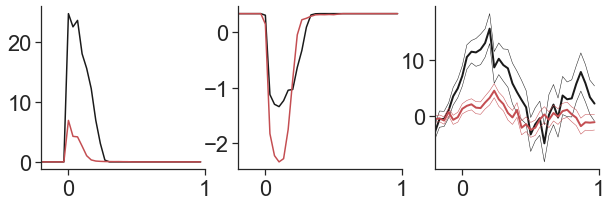

...

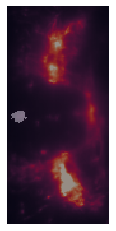

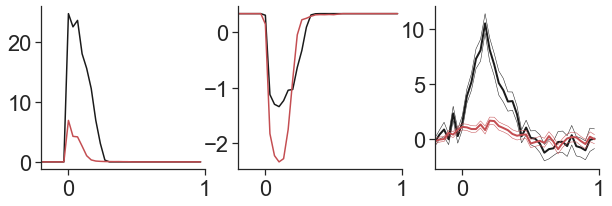

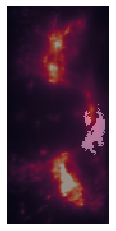

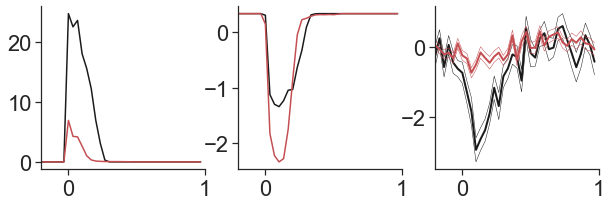

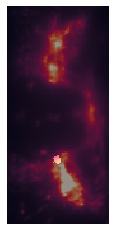

['04112019', 'Fish1-1']
['04112019', 'Fish1-2']


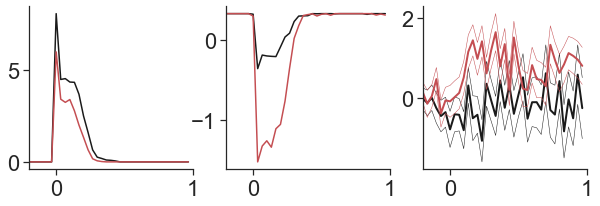

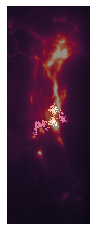

['04112019', 'Fish1-3']


In [12]:
vel_list = []
power_list = []
power_con_list = []
fish_list = []

for index, row in dat_xls_file.iterrows():
    if row['type'] != 'tph2':
        continue
    if row['task'] != 'Gain adaptation':
        continue
    if row['area'] != 'Glu':
        continue
    folder = row['folder']
    fish = row['fish']
    rootDir = row['rootDir']
    swm_dir = dat_folder+f'{folder}/{fish}/swim/'
    img_dir = rootDir+f'{folder}/{fish}/Registered'
    dff_dir = dat_folder+f'{folder}/{fish}/Data/'
    
    frame_stimParams = np.load(swm_dir+'frame_stimParams.npy', allow_pickle=True)[()];
    frame_swim_tcourse = np.load(swm_dir+"frame_swim_tcourse_series.npy", allow_pickle=True)[()];
    rawdata = np.load(swm_dir+"rawdata.npy", allow_pickle=True)[()]
    swimdata = np.load(swm_dir+"swimdata.npy", allow_pickle=True)[()]
    reclen=len(swimdata['fltCh1'])
    frame_tcourse=np.zeros((reclen,))
    frame=np.where(np.diff((rawdata['ch3']>3).astype('int'))==1)[0]
    for t in range(len(frame)-1):
        frame_tcourse[frame[t]:frame[t+1]]=t
    swim_start = frame_tcourse[np.where(swimdata['swimStartT']>0)[0]].astype('int')
    swim_end = frame_tcourse[np.where(swimdata['swimEndT']>0)[0]].astype('int')
    # collect trial within t-pre, and t-post valid range
    swim_end   = swim_end[((swim_start>t_pre) & (swim_start<(frame_swim_tcourse.shape[1]-t_post)))]
    swim_start = swim_start[((swim_start>t_pre) & (swim_start<(frame_swim_tcourse.shape[1]-t_post)))]
    valid = np.diff(swim_start) > t_post
    swim_end = swim_end[:-1][valid]
    swim_start = swim_start[:-1][valid]
    
    swim_list = []
    for ntype in range(3):
        _ = swim_start[np.where(frame_stimParams[2,swim_start]==ntype+1)[0]]
        valid = np.diff(_) > t_post
        if valid.sum()<10:
            continue
        swim_list.append(_[:-1][valid])
    
    if len(swim_list)<2:
        continue
    if np.concatenate(swim_list).shape[0]<30:
        continue

    # image
    ave = np.load(dff_dir+'ave_img.npy')
    # get dff data
    _ = np.load(dff_dir+'components.npz');
    A_ = _['A_']
    C_ = _['C_']
    dFF_ = C_.T
    n_pix = dFF_.shape[-1]

    dff_list = []
    pswim_list = []
    vis_list = []
    num_swim_list = []
    t_len = int(t_pre+t_post)
    for nn_, nswim in enumerate(swim_list):
        num_swim = len(nswim)
        num_swim_list.append(num_swim)
        dff_ = np.zeros((num_swim, t_len, n_pix))
        pswim_ = np.zeros((num_swim, t_len))
        vis_ = np.zeros((num_swim, t_len))
        for ns, s in enumerate(nswim):
            l_swim = frame_swim_tcourse[1,(s-t_pre):(s+t_post)]
            r_swim = frame_swim_tcourse[2,(s-t_pre):(s+t_post)]
            pswim_[ns] = np.sqrt(l_swim**2 + r_swim**2)*100000 # TK: 10000
            dff_[ns] = dFF_[(s-t_pre):(s+t_post), :] - dFF_[(s-t_flat):s, :].mean(axis=0, keepdims=True)
            vis_[ns] = -frame_stimParams[0,(s-t_pre):(s+t_post)]*10000
        
        valid_ = pswim_[:, -t_valid:].sum(axis=-1)==0
        # valid_ = valid_ & (pswim_.max(axis=-1)<20) # results hold as it changed to 100
        valid_ = valid_ & (pswim_[:, :t_pre].sum(axis=-1)==0)
        valid_ = valid_ & ((vis_[:, :t_pre]<0).sum(axis=-1)==0)
        
        if valid_.sum()>10:
            dff_list.append(dff_[valid_])
            pswim_list.append(pswim_[valid_])
            vis_list.append(vis_[valid_])
    
    if len(dff_list)<2:
        continue

#     fig, ax = plt.subplots(1, 3, figsize=(10, 3))
#     ax = ax.flatten()
#     color_list = ['k', 'r', 'b']
#     for n in range(3):
#         ax[0].plot(np.arange(-t_pre, t_post)/frame_rate, pswim_list[n].mean(axis=0), color_list[n])
#         ax[1].plot(np.arange(-t_pre, t_post)/frame_rate, vis_list[n].mean(axis=0), color_list[n])
#         ax[2].plot(np.arange(-t_pre, t_post)/frame_rate, dff_list[n].mean(axis=0).mean(axis=-1)*100, color_list[n])
#     #     ax[2].plot(np.arange(-t_pre, t_post)/frame_rate, dff_list[n][:,:,10].mean(axis=0)*100, color_list[n])
#     sns.despine()
#     ax[0].set_xlim([-0.2, 1.0])
#     ax[1].set_xlim([-0.2, 1.0])
#     ax[2].set_xlim([-0.2, 1.0])
#     # plt.savefig('../Plots/glu/example_fish_random_delay.svg')
#     plt.show()

    print([folder, fish])
    n_c = C_.shape[0]
    valid_c = np.zeros(n_c).astype('bool')
    x, y = ave.shape
    for m in range(n_c):
        p_vec = np.ones(t_pre+t_post)
        for n_t in range(t_pre+t_post):
            _, p = ranksums(*[list(dff_list[i][:, n_t, m]) for i in range(2)])
            p_vec[n_t] = p
#         print((p_vec[t_pre:]<0.05).mean())

        if ((p_vec[:t_pre]>0.05).mean()>0.9) and ((p_vec[t_pre:]<0.05).mean()>=0.3):
            valid_c[m] = True
            fig, ax = plt.subplots(1, 3, figsize=(10, 3))
            ax = ax.flatten()
            color_list = ['k', 'r', 'b']
            for n in range(2):
                mean_ = np.median(dff_list[n][:,:,m], axis=0)*100
                sem_ = sem(dff_list[n][:,:,m], axis=0)*100
                ax[0].plot(np.arange(-t_pre, t_post)/frame_rate, pswim_list[n].mean(axis=0), color_list[n])
                ax[1].plot(np.arange(-t_pre, t_post)/frame_rate, vis_list[n].mean(axis=0), color_list[n])
                ax[2].plot(np.arange(-t_pre, t_post)/frame_rate, mean_, color_list[n], lw=2)
                ax[2].plot(np.arange(-t_pre, t_post)/frame_rate, mean_+sem_, color_list[n], lw=0.5)
                ax[2].plot(np.arange(-t_pre, t_post)/frame_rate, mean_-sem_, color_list[n], lw=0.5)
                # ax[2].plot(np.arange(-t_pre, t_post)/frame_rate, dff_list[n][:,:,m].T, color_list[n])
            sns.despine()
            ax[0].set_xlim([-0.2, 1.0])
            ax[1].set_xlim([-0.2, 1.0])
            ax[2].set_xlim([-0.2, 1.0])
            # plt.savefig('../Plots/glu/example_fish_random_delay.svg')
            plt.show()
            
            plt.imshow(ave, vmax=np.percentile(ave, 99))
            plt.imshow(A_[:, m].reshape(y, x).T>0, cmap=plt.cm.gray, alpha=0.4)
            plt.axis('off')
            plt.show()